In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("zomato.csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [4]:
 pd.set_option('display.float_format', '{:.2f}'.format)

In [5]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00
mean,9051128.35,18.37,64.13,25.85,1199.21,1.80,2.67,156.91
std,8791521.28,56.75,41.47,11.01,16121.18,0.91,1.52,430.17
min,53.00,1.00,-157.95,-41.33,0.00,1.00,0.00,0.00
25%,301962.50,1.00,77.08,28.48,250.00,1.00,2.50,5.00
50%,6004089.00,1.00,77.19,28.57,400.00,2.00,3.20,31.00
75%,18352291.50,1.00,77.28,28.64,700.00,2.00,3.70,131.00
max,18500652.00,216.00,174.83,55.98,800000.00,4.00,4.90,10934.00


In [6]:
#1.finding missing values
#2.explore numerical variables
#3.explore catogorical variables
#4.relashonships bw variables

In [7]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [8]:
[i for i in df.columns if df[i].isnull().sum()>0]

['Cuisines']

In [9]:
df_corr=df.corr()
df_corr

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
Restaurant ID,1.00,0.15,-0.23,-0.05,-0.00,-0.13,-0.33,-0.15
Country Code,0.15,1.00,-0.70,0.02,0.04,0.24,0.28,0.15
Longitude,-0.23,-0.70,1.00,0.04,0.05,-0.08,-0.12,-0.09
Latitude,-0.05,0.02,0.04,1.00,-0.11,-0.17,0.00,-0.02
Average Cost for two,-0.00,0.04,0.05,-0.11,1.00,0.08,0.05,0.07
Price range,-0.13,0.24,-0.08,-0.17,0.08,1.00,0.44,0.31
Aggregate rating,-0.33,0.28,-0.12,0.00,0.05,0.44,1.00,0.31
Votes,-0.15,0.15,-0.09,-0.02,0.07,0.31,0.31,1.00


<AxesSubplot:>

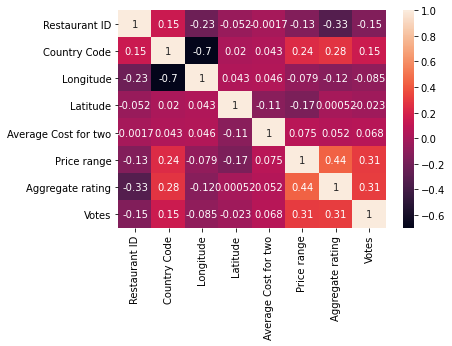

In [10]:
sns.heatmap(df_corr,annot=True)

In [11]:
df_country=pd.read_excel("Country-Code.xlsx")
df_country

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


In [12]:
final_df=pd.merge(df, df_country,on="Country Code", how="left")
final_df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.03,14.57,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.80,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.01,14.55,Japanese,...,Yes,No,No,No,3,4.50,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.06,14.58,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.40,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.06,14.59,"Japanese, Sushi",...,No,No,No,No,4,4.90,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.06,14.58,"Japanese, Korean",...,Yes,No,No,No,4,4.80,Dark Green,Excellent,229,Phillipines


In [13]:
country_names=final_df.Country.value_counts().index
country_names

Index(['India', 'United States', 'United Kingdom', 'Brazil', 'UAE',
       'South Africa', 'New Zealand', 'Turkey', 'Australia', 'Phillipines',
       'Indonesia', 'Singapore', 'Sri Lanka', 'Qatar', 'Canada'],
      dtype='object')

In [14]:
country_value=final_df.Country.value_counts().values
country_value

array([8652,  434,   80,   60,   60,   60,   40,   34,   24,   22,   21,
         20,   20,   20,    4], dtype=int64)

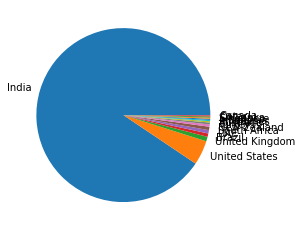

In [15]:
plt.pie(country_value,labels=country_names);

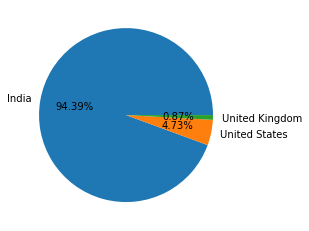

In [16]:
plt.pie(country_value[:3],labels=country_names[:3],autopct="%1.2f%%");

OBS:  Zomato runs most of thier buisness in india, secondly on us, thirdly on uk.

In [17]:
rating_df=pd.DataFrame(final_df.groupby(["Aggregate rating","Rating color","Rating text"]).size().reset_index().rename(columns={0:"Rating count"}))
rating_df
#size is for count aggregation

,Aggregate rating,Rating color,Rating text,Rating count
0,0.00,White,Not rated,2148
1,1.80,Red,Poor,1
2,1.90,Red,Poor,2
3,2.00,Red,Poor,7
4,2.10,Red,Poor,15
5,2.20,Red,Poor,27
6,2.30,Red,Poor,47
7,2.40,Red,Poor,87
8,2.50,Orange,Average,110
9,2.60,Orange,Average,191


OBERVATION: when rating is bw 4.5 to 4.9 -- exellent.
     when rating is bw 4 to 4.4 -- Very Good.
     when rating is bw 3.5 to 3.9 --  Good.
     when rating is bw 3 to 3.4 -- Average.
     when rating is bw 2 to 2.4 -- Poor.
     when rating is 0 -- not rated

In [18]:
import matplotlib

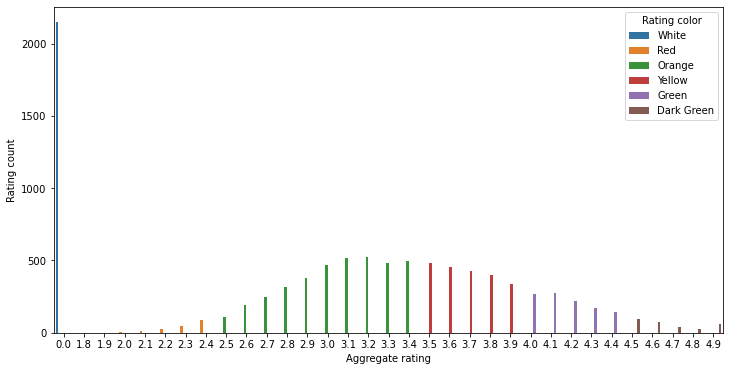

In [19]:
matplotlib.rcParams["figure.figsize"]= (12, 6)
sns.barplot(x="Aggregate rating", y="Rating count",hue="Rating color" ,data=rating_df);

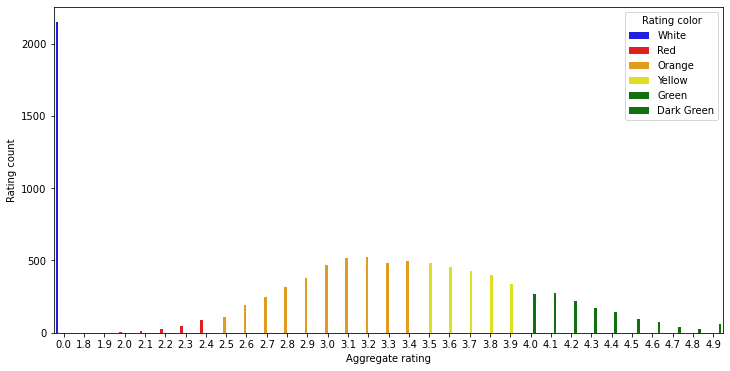

In [20]:
#palette(color arrangement),hue
sns.barplot(x="Aggregate rating", y="Rating count", hue="Rating color", data=rating_df, palette=("blue","red","orange","yellow","green","green"));

OBERVATION: max rating done bw 3 to 3.8

In [21]:
final_df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [22]:
df["Rating color"].value_counts()

Orange        3737
White         2148
Yellow        2100
Green         1079
Dark Green     301
Red            186
Name: Rating color, dtype: int64

In [23]:
df.loc[df["Rating color"]=="White"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
30,6600060,Sandubas Caf��,30,Bras�_lia,"Edif�_cio Jos�� Severo, SCS 6, Bloco A, Loja 9...",Asa Sul,"Asa Sul, Bras�_lia",-47.89,-15.80,"Brazilian, Cafe",...,Brazilian Real(R$),No,No,No,No,1,0.00,White,Not rated,2
58,7305048,Quiosque Chopp Brahma,30,Rio de Janeiro,"Madureira Shopping - Loja 289/290, Piso 2, Est...",Madureira,"Madureira, Rio de Janeiro",-43.34,-22.87,"Bar Food, Brazilian",...,Brazilian Real(R$),No,No,No,No,3,0.00,White,Not rated,1
69,6710645,Cantinho da Gula,30,S��o Paulo,"Rua Pedroso Alvarenga, 522, Itaim Bibi, S��o P...",Itaim Bibi,"Itaim Bibi, S��o Paulo",-46.68,-23.58,Brazilian,...,Brazilian Real(R$),No,No,No,No,2,0.00,White,Not rated,0
77,6701419,Divino Fog��o,30,S��o Paulo,"Shopping Metr�� Santa Cruz - Piso L2, Rua Domi...","Shopping Metr�� Santa Cruz, Vila Mariana","Shopping Metr�� Santa Cruz, Vila Mariana, S��o...",-46.64,-23.60,"Brazilian, Mineira",...,Brazilian Real(R$),No,No,No,No,3,0.00,White,Not rated,2
78,6703956,Super Grill,30,S��o Paulo,"Shopping Morumbi - Piso Lazer, Avenida Roque P...","Shopping Morumbi, Santo Amaro","Shopping Morumbi, Santo Amaro, S��o Paulo",-46.70,-23.62,Brazilian,...,Brazilian Real(R$),No,No,No,No,2,0.00,White,Not rated,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9109,18277023,Bread & Pasta,1,Noida,"Shop 15, Near HDFC Bank, Tulip Mall, Sector 48...","Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida, Noida",77.37,28.56,Fast Food,...,Indian Rupees(Rs.),No,No,No,No,1,0.00,White,Not rated,1
9110,18313203,Chillies Cafe,1,Noida,"G-11, Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida, Noida",77.37,28.56,Fast Food,...,Indian Rupees(Rs.),No,No,No,No,2,0.00,White,Not rated,3
9111,18254559,Platters,1,Noida,"Shop 1, Tulip Mall, Near HDFC Bank, Sector 48,...","Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida, Noida",77.37,28.56,"North Indian, Chinese",...,Indian Rupees(Rs.),No,No,No,No,2,0.00,White,Not rated,0
9112,18255132,The Grand,1,Noida,"G-5, Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida","Tulip Mall, Sector 48, Noida, Noida",77.37,28.56,"Raw Meats, Fast Food",...,Indian Rupees(Rs.),No,No,No,No,1,0.00,White,Not rated,1


# Cities with highest order.

In [24]:
city_name=final_df.City.value_counts().index
city_count=final_df.City.value_counts().values

([<matplotlib.patches.Wedge at 0x218762810a0>,
 [Text(-0.6836225695617262, 0.8617773392157762, 'New Delhi'),
  Text(0.24897482286810813, -1.0714530029720364, 'Gurgaon'),
  Text(0.9941442744692855, -0.47082604169686504, 'Noida')],
 [Text(-0.37288503794275973, 0.47006036684496877, '71.35%'),
  Text(0.13580444883714987, -0.5844289107120197, '14.57%'),
  Text(0.542260513346883, -0.25681420456192633, '14.08%')])

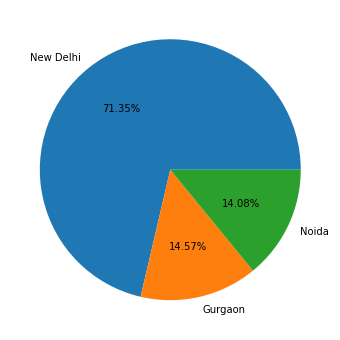

In [25]:
plt.pie(city_count[:3], labels=city_name[:3],autopct="%1.2f%%")

OBSERVATION: New delhi makes the high order compared to other cities

# q1. find the countries name that has zero rating

In [26]:
final_df[final_df["Aggregate rating"]==0.0].loc[:,"Country"].unique()

array(['Brazil', 'United States', 'India', 'United Kingdom'], dtype=object)

In [27]:
final_df[final_df["Rating color"]=="White"].groupby("Country").size().reset_index()

,Country,0
0,Brazil,5
1,India,2139
2,United Kingdom,1
3,United States,3


OBSERVATION: indian's didn't gave rating much, then comes brazil but there's huge differece b/w them.

In [28]:
pd.set_option("display.max_rows",None)

In [29]:
final_df.groupby(["Country","Rating color"]).size().reset_index()

,Country,Rating color,0
0,Australia,Dark Green,1
1,Australia,Green,5
2,Australia,Orange,4
3,Australia,Red,1
4,Australia,Yellow,13
5,Brazil,Dark Green,16
6,Brazil,Green,20
7,Brazil,Orange,8
8,Brazil,White,5
9,Brazil,Yellow,11


In [30]:
final_df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

# 2.Find out which currency is used by which country

In [31]:
final_df.groupby(["Country","Currency"]).size().reset_index()

,Country,Currency,0
0,Australia,Dollar($),24
1,Brazil,Brazilian Real(R$),60
2,Canada,Dollar($),4
3,India,Indian Rupees(Rs.),8652
4,Indonesia,Indonesian Rupiah(IDR),21
5,New Zealand,NewZealand($),40
6,Phillipines,Botswana Pula(P),22
7,Qatar,Qatari Rial(QR),20
8,Singapore,Dollar($),20
9,South Africa,Rand(R),60


# q3. find out which countries has online delivery

In [32]:
final_df[final_df["Has Online delivery"]=="Yes"].loc[:,"Country"].unique()

array(['UAE', 'India'], dtype=object)

In [33]:
final_df[final_df["Has Online delivery"]=="Yes"].groupby("Country").size().reset_index()

,Country,0
0,India,2423
1,UAE,28


In [34]:
final_df[final_df["Has Online delivery"]=="Yes"].Country.value_counts()

India    2423
UAE        28
Name: Country, dtype: int64

In [35]:
final_df[final_df["Has Online delivery"]=="No"].Country.value_counts()

India             6229
United States      434
United Kingdom      80
Brazil              60
South Africa        60
New Zealand         40
Turkey              34
UAE                 32
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Sri Lanka           20
Qatar               20
Canada               4
Name: Country, dtype: int64

OBSERVATION: Zomato has more customers in india so india is highest in all attributes, here also because of more customers in india, more customers orders in online and also many orders done without delivery.

# Top 10 cuisine foods

In [36]:
cusisines_df=final_df["Cuisines"].value_counts().head(10).reset_index()
cusisines_df

,index,Cuisines
0,North Indian,936
1,"North Indian, Chinese",511
2,Fast Food,354
3,Chinese,354
4,"North Indian, Mughlai",334
5,Cafe,299
6,Bakery,218
7,"North Indian, Mughlai, Chinese",197
8,"Bakery, Desserts",170
9,Street Food,149


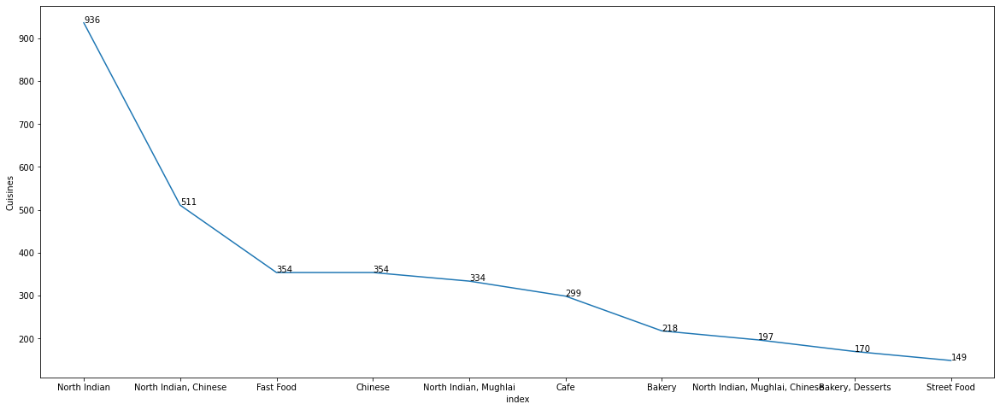

In [100]:
plt.figure(figsize=(20,8))
sns.lineplot(x="index", y="Cuisines", data=cusisines_df)
def addlabels(x,y): #if x axis is catogorical and y axis is numerical this function is applicable.
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'left')
addlabels(cusisines_df["index"],cusisines_df["Cuisines"])

OBSERVATION: "A cuisine is specific set of cooking traditions and practices, often associated with a specific culture or region".
            here northindian foods and Chinese foods are the most ordered cuisine foods.

In [38]:
final_df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

# Table booking

In [55]:
pd.set_option("display.max_columns",None)

In [56]:
final_df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.03,14.57,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.80,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.01,14.55,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.50,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.06,14.58,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.40,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.06,14.59,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.90,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.06,14.58,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.80,Dark Green,Excellent,229,Phillipines


In [80]:
tb_1=final_df[final_df["Has Table booking"]=="Yes"].groupby("Country").size().reset_index().rename(columns={0:"has table booking"}).sort_values("has table booking",ascending=False)
tb_1

,Country,has table booking
0,India,1111
4,UAE,18
1,Phillipines,14
5,United Kingdom,12
3,South Africa,2
2,Qatar,1


In [78]:
tb2=final_df[final_df["Has Table booking"]=="No"].groupby("Country").size().reset_index().rename(columns={0:"No table booking"}).sort_values("No table booking",ascending=False)
tb2

,Country,No table booking
3,India,7541
14,United States,434
13,United Kingdom,68
1,Brazil,60
9,South Africa,58
12,UAE,42
5,New Zealand,40
11,Turkey,34
0,Australia,24
4,Indonesia,21


In [85]:
tot_tb_book=pd.merge(tb_1,tb2,on="Country",how="outer").replace(np.nan, 0).astype({"has table booking":"int"}).set_index("Country")
tot_tb_book

,has table booking,No table booking
Country,,
India,1111,7541
UAE,18,42
Phillipines,14,8
United Kingdom,12,68
South Africa,2,58
Qatar,1,19
United States,0,434
Brazil,0,60
New Zealand,0,40


<AxesSubplot:xlabel='Country'>

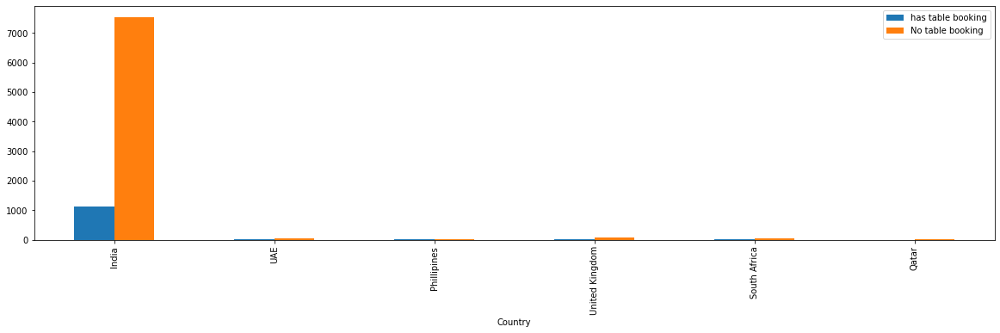

In [101]:
tot_tb_book[0:6].plot(kind="bar",figsize=(20,5))

OBSERVATION: From this its sure that many of them are not coming to the restarents to eat, all are ordering food through online. Many contries didn't even booking single table. India has huge diffrence, people's are ordering food in online rather than coming to restarents.

# price range in indian cities

In [103]:
final_df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [106]:
final_df.groupby(["Country","City","Price range"]).size()

Country         City                    Price range
Australia       Armidale                2                 1
                Balingup                2                 1
                Beechworth              2                 1
                Dicky Beach             1                 1
                East Ballina            2                 1
                Flaxton                 3                 1
                Forrest                 2                 1
                Hepburn Springs         1                 1
                                        2                 1
                Huskisson               2                 1
                Inverloch               1                 1
                Lakes Entrance          1                 1
                Lorn                    2                 1
                Macedon                 2                 1
                Mayfield                2                 1
                Middleton Beach         3       

In [111]:
india_df=final_df[final_df["Country"]=="India"]
india_df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
624,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.01,27.16,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,No,No,No,3,3.90,Yellow,Good,140,India
625,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.00,0.00,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,No,No,No,2,3.50,Yellow,Good,71,India
626,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.01,27.16,North Indian,500,Indian Rupees(Rs.),No,No,No,No,2,3.60,Yellow,Good,94,India
627,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",78.00,27.20,Rajasthani,400,Indian Rupees(Rs.),No,No,No,No,2,4.00,Green,Very Good,87,India
628,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.01,27.20,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,No,No,No,3,4.20,Green,Very Good,177,India
629,3400325,MoMo Cafe,1,Agra,"Courtyard by Marriott Agra, Phase 2, Fatehabad...","Courtyard by Marriott Agra, Tajganj","Courtyard by Marriott Agra, Tajganj, Agra",0.00,0.00,"North Indian, European",2000,Indian Rupees(Rs.),No,No,No,No,4,4.00,Green,Very Good,45,India
630,3400059,Peshawri - ITC Mughal,1,Agra,"ITC Mughal, Fatehabad Road, Tajganj, Agra","ITC Mughal, Tajganj","ITC Mughal, Tajganj, Agra",78.04,27.16,"North Indian, Mughlai",2500,Indian Rupees(Rs.),No,No,No,No,4,4.30,Green,Very Good,133,India
631,3400060,Taj Bano - ITC Mughal,1,Agra,"ITC Mughal, Fatehabad Road, Tajganj, Agra","ITC Mughal, Tajganj","ITC Mughal, Tajganj, Agra",78.04,27.16,Mughlai,2500,Indian Rupees(Rs.),No,No,No,No,4,4.00,Green,Very Good,41,India
632,3400348,G Thal,1,Agra,"3/20, KPS Tower, Near Tulsi Talkies, Bypass Ro...",Khandari,"Khandari, Agra",0.00,0.00,"Rajasthani, Gujarati, Mughlai",800,Indian Rupees(Rs.),No,No,No,No,3,3.60,Yellow,Good,59,India
633,3400072,Dawat-e-Nawab - Radisson Blu,1,Agra,"Radisson Blu, Taj East Gate Road, Tajganj, Agra","Radisson Blu, Tajganj","Radisson Blu, Tajganj, Agra",78.06,27.16,"North Indian, Mughlai",3600,Indian Rupees(Rs.),No,No,No,No,4,3.80,Yellow,Good,46,India


In [142]:
pr_df=india_df.groupby(["Country","City","Price range"]).size().reset_index().rename(columns={0:"Count"}).sort_values("Count",ascending=False)
pr_df1=pr_df[pr_df["Price range"]==4].iloc[:,1:]
pr_df1

,City,Price range,Count
112,New Delhi,4,216
58,Gurgaon,4,67
116,Noida,4,21
54,Goa,4,13
125,Puducherry,4,8
45,Dehradun,4,5
3,Agra,4,5
76,Kanpur,4,5
108,Nashik,4,4
69,Indore,4,4


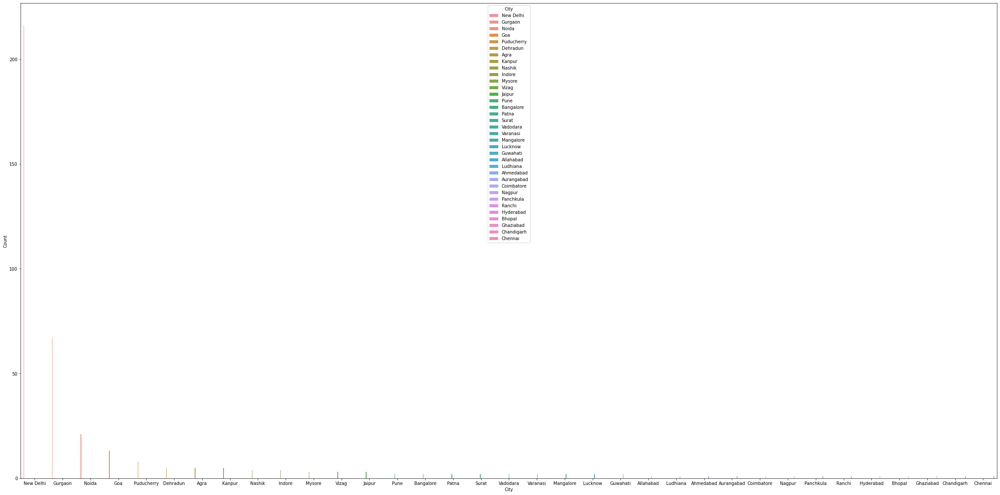

In [144]:
plt.figure(figsize=(40,20))
sns.barplot(x="City", y="Count", data=pr_df1,hue="City");